## arcface, retinaface

In [ ]:
pip uninstall opencv-python-headless==4.5.5.62

In [ ]:
pip install opencv-python-headless==4.5.2.52

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 38.2 MB 1.3 MB/s 


In [ ]:
!pip install -U retinaface_pytorch > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.12.0 requires torch==1.11.0, but you have torch 1.9.0 which is incompatible.
torchaudio 0.11.0+cu113 requires torch==1.11.0, but you have torch 1.9.0 which is incompatible.


In [ ]:
from retinaface.pre_trained_models import get_model
from retinaface.utils import vis_annotations

In [ ]:
model = get_model("resnet50_2020-07-20", max_size=250)

Downloading: "https://github.com/ternaus/retinaface/releases/download/0.01/retinaface_resnet50_2020-07-20-f168fae3c.zip" to /root/.cache/torch/hub/checkpoints/retinaface_resnet50_2020-07-20-f168fae3c.zip


  0%|          | 0.00/96.9M [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/torch/hub.py:480: UserWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  warnings.warn('Falling back to the old format < 1.6. This support will be '


In [ ]:
model.eval()

In [ ]:
pip install arcface

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 63 kB 551 kB/s 
     |████████████████████████████████| 60.5 MB 6.2 MB/s 
     |████████████████████████████████| 596 kB 45.0 MB/s 
     |████████████████████████████████| 462 kB 43.9 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency confli

In [ ]:
from arcface import ArcFace
face_model = ArcFace.ArcFace()

## init

In [ ]:
import cv2

from matplotlib import pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import numpy as np
from numpy import dot, sqrt

def cosine_similarity(x, y):
  return dot(x, y) / (sqrt(dot(x, x)) * sqrt(dot(y, y)))

In [ ]:
from queue import Queue
import os
import glob 

In [ ]:
directory = r'gdrive/MyDrive/graduate_work'

os.chdir(directory)

In [ ]:
print(os.getcwd())

/content/gdrive/MyDrive/graduate_work


# Functions init

In [ ]:
def open_image(path):
    image = cv2.imread(path) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [ ]:
def get_face(image):
    annotation = model.predict_jsons(image)
    if annotation[0]['score'] == -1:
        return None, -1
    bbox = annotation[0]['bbox']
    x1,y1,x2,y2 = int(bbox[0]),int(bbox[1]),int(bbox[2]),int(bbox[3])
    return image[y1:y2, x1:x2], 1

In [ ]:
def get_embadding(face):
    return face_model.calc_emb(face)

In [ ]:
def get_embaddings(cropped_faces):
    array_embadding = []
    for image in cropped_faces:
      array_embadding.append(face_model.calc_emb(image))
    return array_embadding

In [ ]:
def get_faces_from_path(directory):
    cropped_faces = []
    for path in glob.iglob(os.path.join(directory, "*.jpg")):
        image = cv2.imread(path) 
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        cropped_faces.append(image)
    return cropped_faces

In [ ]:
def merge_answers(ans_ids_separated):
    ans_ids = []
    for got_ans in ans_ids_separated:
        ans_ids = ans_ids + got_ans
    return ans_ids

# Algo init

In [ ]:
class Algorithm_greedy(object):
    def __init__(self, n, adj_matrix):
        self.n = n
        self.adj_matrix = adj_matrix
        self.edges = []
        for v in range(self.n):
            self.edges.append([])
            for u in range(self.n):
                if v != u and self.adj_matrix[v][u]:
                    self.edges[v].append(u)
        self.components = []
        self.answers = []
        self.diam = int(0)

    def bfs(self, v):
        component = []
        q = Queue()
        q.put(v)
        self.used[v] = 1
        while q.empty() == False:
            v = q.get()
            component.append(v)
            for u in self.edges[v]:
                if self.used[u] == 0:
                    q.put(u)
                    self.used[u] = 1
        return component

    def solve_dominating_set(self, component):
        component = sorted(component)
        my_set = []
        while 1:
            id_del = -1
            for v in component:
                if self.alive[v] == 0:
                    continue
                self.potential[v] = 0
                for u in self.edges[v]:
                    self.potential[v] += self.alive[u]
                if id_del == -1 or self.potential[id_del] < self.potential[v]:
                    id_del = v
            if id_del == -1:
                break
            my_set.append(id_del)
            self.alive[id_del] = 0
            for u in self.edges[id_del]:
                self.alive[u] = 0
        return my_set

    def work(self):
        self.used = [0]*self.n
        self.alive = [1]*self.n
        self.potential = [0]*self.n
        for v in range(self.n):
            if self.used[v]:
                continue
            component = self.bfs(v)
            self.components.append(component)
            ans_ids = self.solve_dominating_set(component)
            self.answers.append(ans_ids)

    def getdegs(self):
        hist = {}
        for v in range(self.n):
            if len(self.edges[v]) not in hist.keys():
               hist[len(self.edges[v])] = 0
            hist[len(self.edges[v])]  += 1
        sorted_hist_keys = []
        sorted_hist_values = []
        mean, cnt = 0, 0
        for key in sorted(hist.keys()):
            mean += key*hist[key]
            cnt += hist[key]
            sorted_hist_keys.append(str(key))
            sorted_hist_values.append(hist[key])
        mean /= cnt
        return sorted_hist_keys, sorted_hist_values, mean
    
    def calc_diam(self):
        d = np.zeros(shape=(self.n,self.n))
        INF = int(1e9)
        for i in range(self.n):
            for j in range(self.n):
                if self.adj_matrix[i,j] == 1:
                    d[i,j] = 1
                else:
                    d[i,j] = INF
            d[i,i] = 0
        for k in range(self.n):
            for i in range(self.n):
                for j in range(self.n):
                    d[i,j] = min(d[i,j], d[i,k]+d[k,j])
        for i in range(self.n):
            for j in range(self.n):
                if d[i,j] != INF:
                    self.diam = max(self.diam, d[i,j])

In [ ]:
class Algorithm_greedy2(object):
    def __init__(self, n, adj_matrix):
        self.n = n
        self.adj_matrix = adj_matrix
        self.edges = []
        for v in range(self.n):
            self.edges.append([])
            for u in range(self.n):
                if v != u and self.adj_matrix[v][u]:
                    self.edges[v].append(u)
        self.components = []
        self.answers = []
        self.diam = int(0)

    def bfs(self, v):
        component = []
        q = Queue()
        q.put(v)
        self.used[v] = 1
        while q.empty() == False:
            v = q.get()
            component.append(v)
            for u in self.edges[v]:
                if self.used[u] == 0:
                    q.put(u)
                    self.used[u] = 1
        return component

    def solve_dominating_set(self, component):
        component = sorted(component)
        my_set = []
        while 1:
            id_del = -1
            have_not_marked = 0
            for v in component:
                if self.alive[v] == 0:
                    continue
                if self.marked[v] == 0:
                    have_not_marked = 1
                self.potential[v] = 0
                for u in self.edges[v]:
                    if self.alive[u] == 1 and self.marked[u] == 0:
                        self.potential[v] += 1
                if id_del == -1 or self.potential[id_del] < self.potential[v]:
                    id_del = v
            if id_del == -1:
                break
            if have_not_marked == 0:
                break
            my_set.append(id_del)
            self.alive[id_del] = 0
            for u in self.edges[id_del]:
                self.marked[u] = 1
        return my_set

    def work(self):
        self.used = [0]*self.n
        self.alive = [1]*self.n
        self.marked = [0]*self.n
        self.potential = [0]*self.n
        for v in range(self.n):
            if self.used[v]:
                continue
            component = self.bfs(v)
            self.components.append(component)
            ans_ids = self.solve_dominating_set(component)
            self.answers.append(ans_ids)

    def getdegs(self):
        hist = {}
        for v in range(self.n):
            if len(self.edges[v]) not in hist.keys():
               hist[len(self.edges[v])] = 0
            hist[len(self.edges[v])]  += 1
        sorted_hist_keys = []
        sorted_hist_values = []
        mean, cnt = 0, 0
        for key in sorted(hist.keys()):
            mean += key*hist[key]
            cnt += hist[key]
            sorted_hist_keys.append(str(key))
            sorted_hist_values.append(hist[key])
        mean /= cnt
        return sorted_hist_keys, sorted_hist_values, mean
    
    def calc_diam(self):
        d = np.zeros(shape=(self.n,self.n))
        INF = int(1e9)
        for i in range(self.n):
            for j in range(self.n):
                if self.adj_matrix[i,j] == 1:
                    d[i,j] = 1
                else:
                    d[i,j] = INF
            d[i,i] = 0
        for k in range(self.n):
            for i in range(self.n):
                for j in range(self.n):
                    d[i,j] = min(d[i,j], d[i,k]+d[k,j])
        for i in range(self.n):
            for j in range(self.n):
                if d[i,j] != INF:
                    self.diam = max(self.diam, d[i,j])

# Начальный эксперимент

In [ ]:
video_path = r'/content/gdrive/MyDrive/graduate_work/video2.mp4'

cap = cv2.VideoCapture(video_path)
i = 0

period = 3

cropped_faces = []

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
        break
    if i%period == 0:
      frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      face, result = get_face(frame)
      if result == 1:
          cropped_faces.append(face)
    i+=1
 
cap.release()
cv2.destroyAllWindows()

In [ ]:
array_embadding = get_embaddings(cropped_faces)

In [ ]:
n = len(array_embadding)

cosine_matrix = np.zeros(shape = (n, n), dtype = np.float64)

for i in range(n):
  for j in range(n):
      cosine_matrix[i, j] = cosine_similarity(array_embadding[i], array_embadding[j])

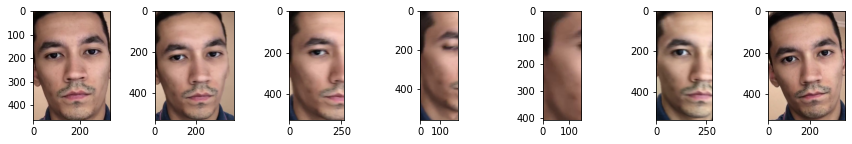

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 7, figsize=(15, 2))

ids = [10,53,58,61,63,68,111]

for i in range(7):
  ax[i].imshow(cropped_faces[ids[i]])

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)

    algorithm2 = Algorithm_greedy2(n, adj_matrix)
    algorithm2.work()
    ans_ids2 = merge_answers(algorithm2.answers)

    print(f"threshold = {threshold}, Algorithm1 = {len(ans_ids)}, Algorithm2 = {len(ans_ids2)}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


threshold = 0.4, Algorithm1 = 2, Algorithm2 = 2
threshold = 0.5, Algorithm1 = 3, Algorithm2 = 3
threshold = 0.6, Algorithm1 = 3, Algorithm2 = 3
threshold = 0.7, Algorithm1 = 5, Algorithm2 = 5
threshold = 0.8, Algorithm1 = 6, Algorithm2 = 6


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


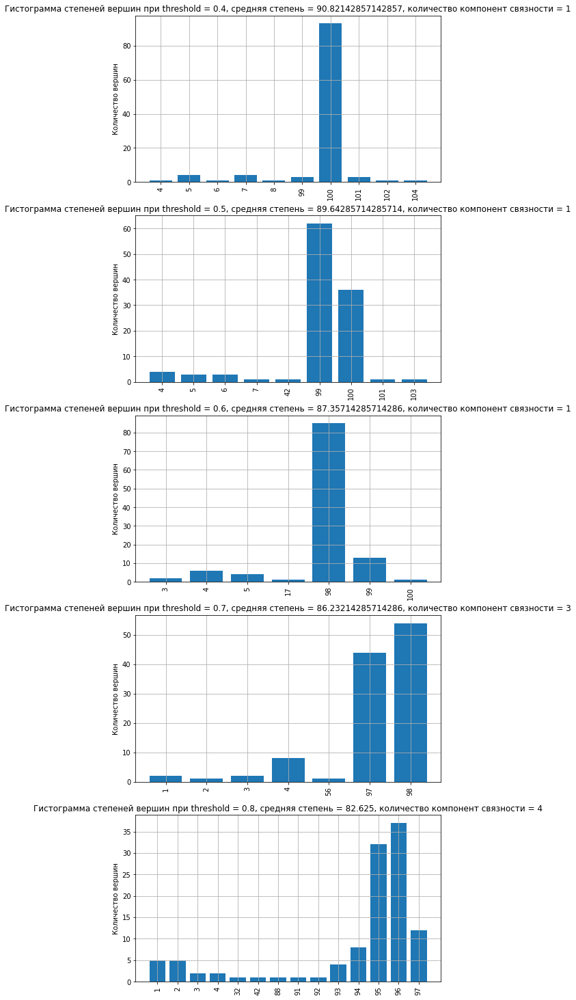

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

fig, ax = plt.subplots(nrows = len(threshold_values), figsize=(8, 26))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    keys, values, mean = algorithm.getdegs()
    ax[i].bar(keys, values)
    ax[i].grid()
    ax[i].set_xticklabels(keys, rotation=90)
    ax[i].set_ylabel("Количество вершин")
    ax[i].set_title(f"Гистограмма cтепеней вершин при threshold = {threshold}, средняя степень = {mean}, количество компонент связности = {len(algorithm.components)}")

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


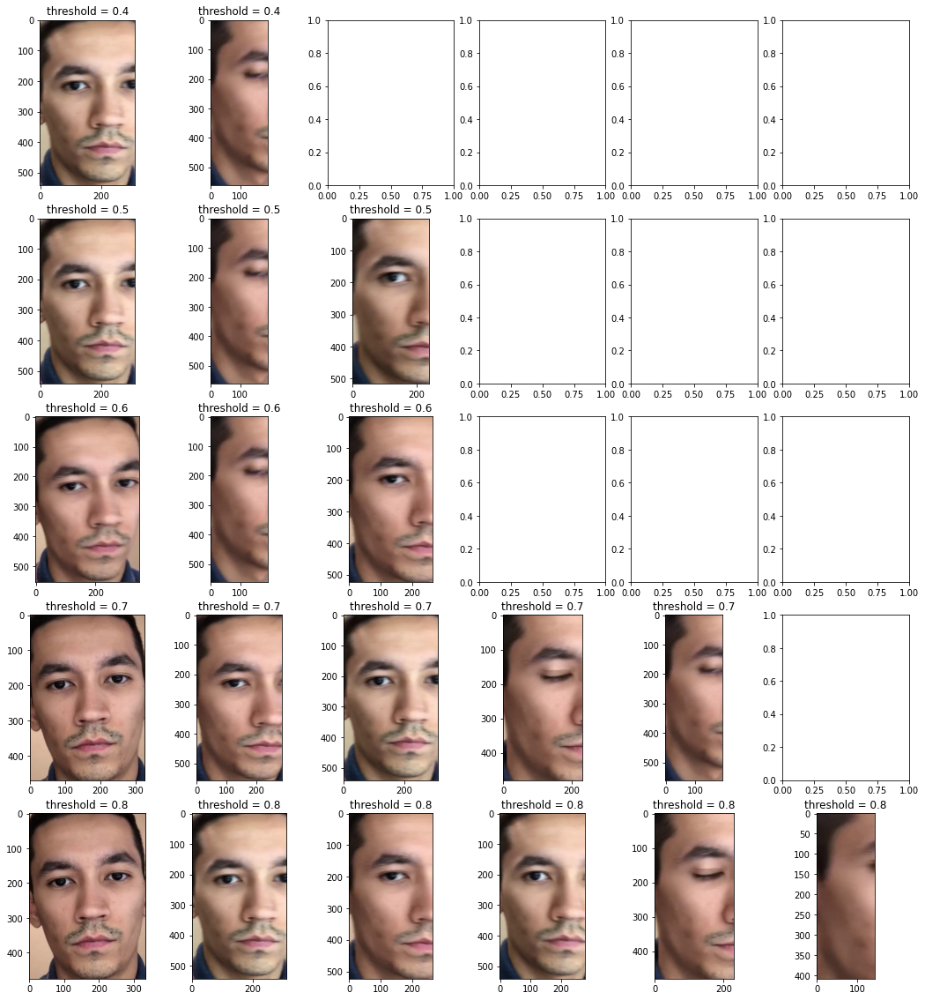

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

fig, ax = plt.subplots(nrows = len(threshold_values), ncols = 6, figsize=(18, 20))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    for j in range(len(ans_ids)):
        ax[i][j].set_title(f"threshold = {threshold}")
        ax[i][j].imshow(cropped_faces[ans_ids[j]])

plt.show()

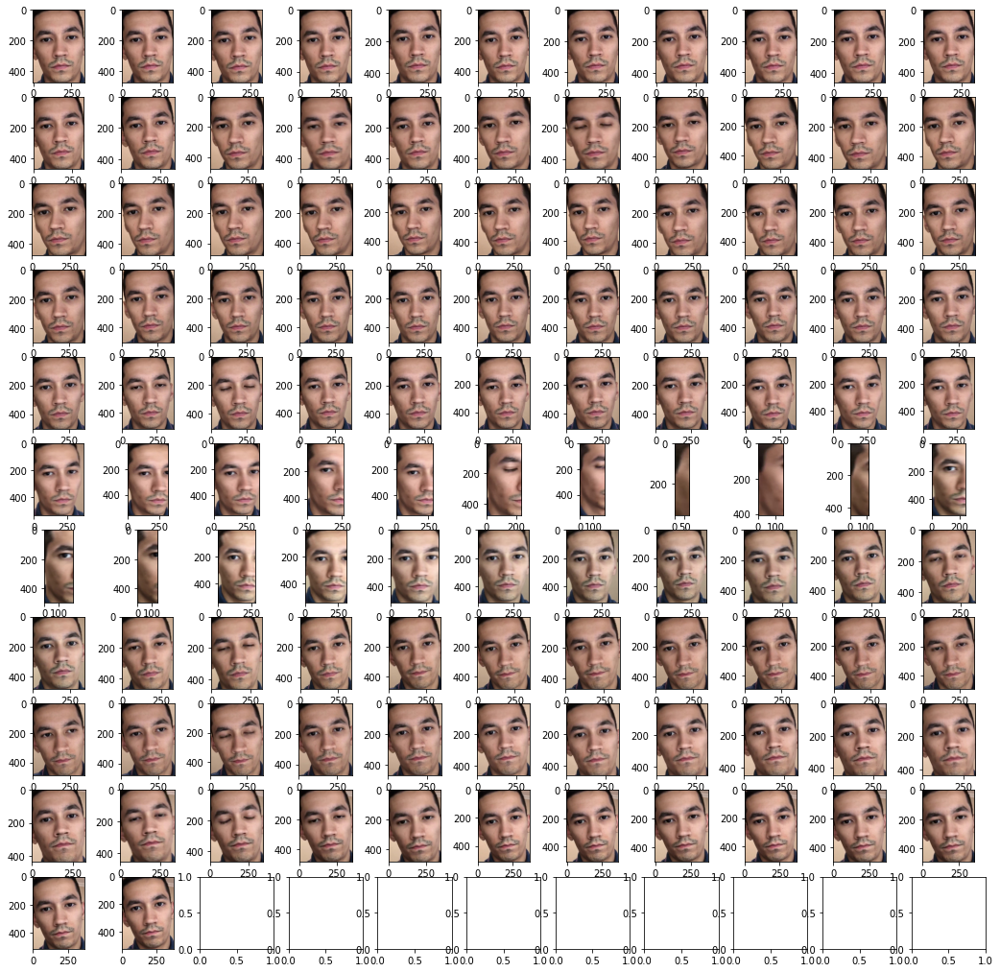

In [ ]:
sq_size = int(sqrt(n)) + 1

fig, ax = plt.subplots(nrows = sq_size, ncols = sq_size, figsize=(18, 18))

for i,image in enumerate(cropped_faces):
  ax[i//sq_size][i%sq_size].imshow(image)

# Эксперименты - Colin_Powell

In [ ]:
print(os.getcwd())

/content/gdrive/MyDrive/graduate_work


In [ ]:
directory = r'/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Colin_Powell'

cropped_faces = []

counter = int(0)

for path in glob.iglob(os.path.join(directory, "*.jpg")):
    
    if counter == 177:
        counter += 1
        continue
    counter += 1
    image = cv2.imread(path) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    face, result = get_face(image)
    if result == 1:
        cropped_faces.append(face)

In [ ]:
print(len(cropped_faces))

235


In [ ]:
array_embadding = get_embaddings(cropped_faces)

In [ ]:
n = len(array_embadding)

cosine_matrix = np.zeros(shape = (n, n), dtype = np.float64)

for i in range(n):
  for j in range(n):
      cosine_matrix[i, j] = cosine_similarity(array_embadding[i], array_embadding[j])

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.calc_diam()
    print(algorithm.diam)

2.0
2.0
3.0
5.0
8.0


In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)

    algorithm2 = Algorithm_greedy2(n, adj_matrix)
    algorithm2.work()
    ans_ids2 = merge_answers(algorithm2.answers)

    print(f"threshold = {threshold}, Algorithm1 = {len(ans_ids)}, Algorithm2 = {len(ans_ids2)}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


threshold = 0.4, Algorithm1 = 1, Algorithm2 = 1
threshold = 0.5, Algorithm1 = 2, Algorithm2 = 2
threshold = 0.6, Algorithm1 = 3, Algorithm2 = 3
threshold = 0.7, Algorithm1 = 17, Algorithm2 = 12
threshold = 0.8, Algorithm1 = 69, Algorithm2 = 52


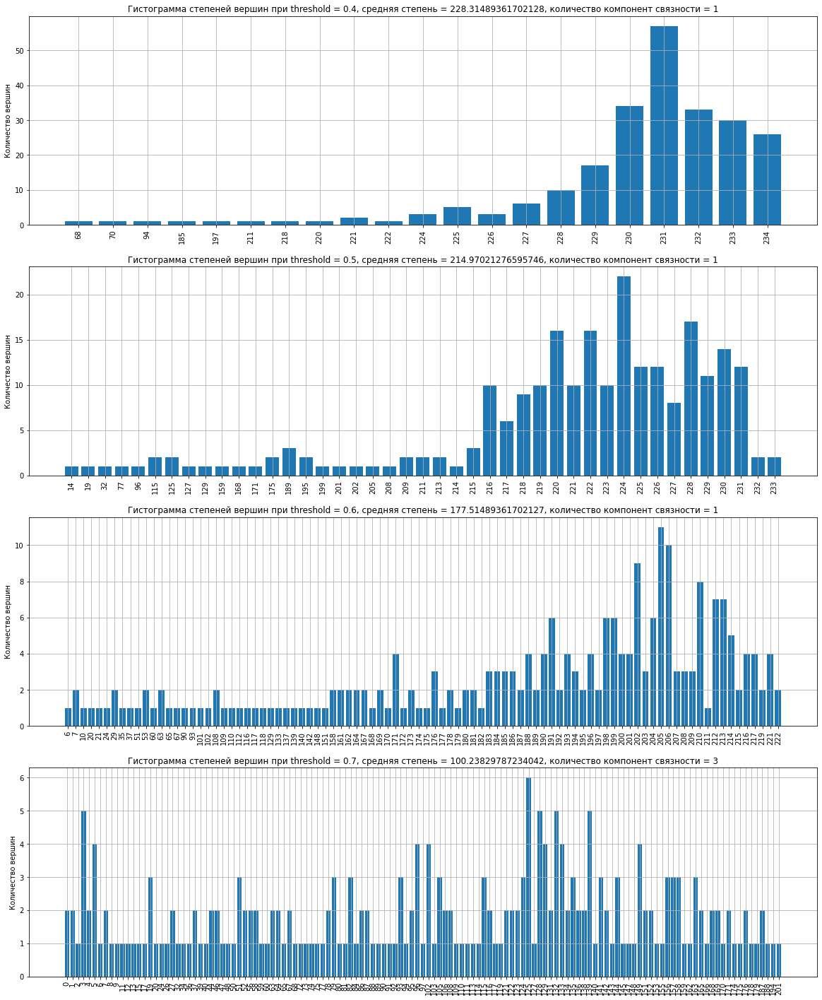

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7]

fig, ax = plt.subplots(nrows = len(threshold_values), figsize=(20, 25))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int64)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    keys, values, mean = algorithm.getdegs()
    ax[i].bar(keys, values)
    ax[i].grid()
    ax[i].set_xticklabels(keys, rotation=90)
    ax[i].set_ylabel("Количество вершин")
    ax[i].set_title(f"Гистограмма cтепеней вершин при threshold = {threshold}, средняя степень = {mean}, количество компонент связности = {len(algorithm.components)}")

plt.show()

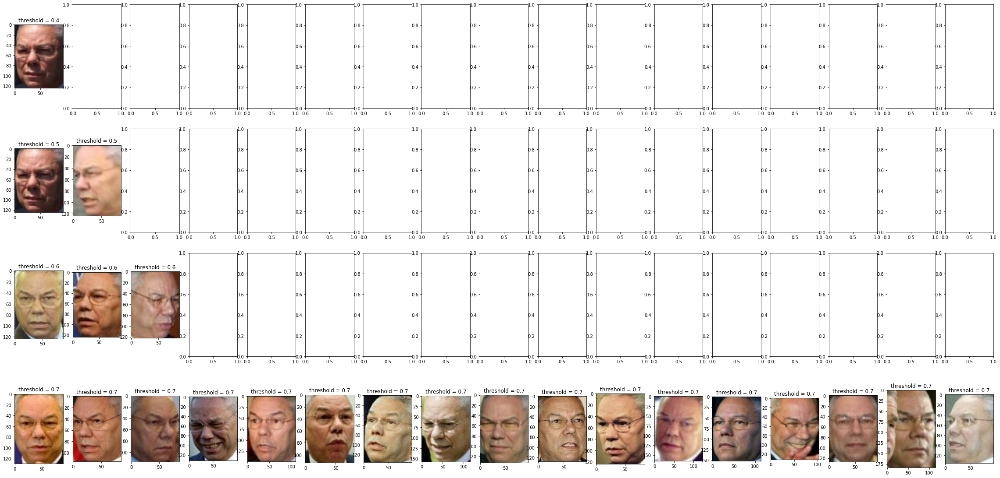

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7]

fig, ax = plt.subplots(nrows = len(threshold_values), ncols = 17, figsize=(40, 20))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    for j in range(len(ans_ids)):
        ax[i][j].set_title(f"threshold = {threshold}")
        ax[i][j].imshow(cropped_faces[ans_ids[j]])

plt.show()

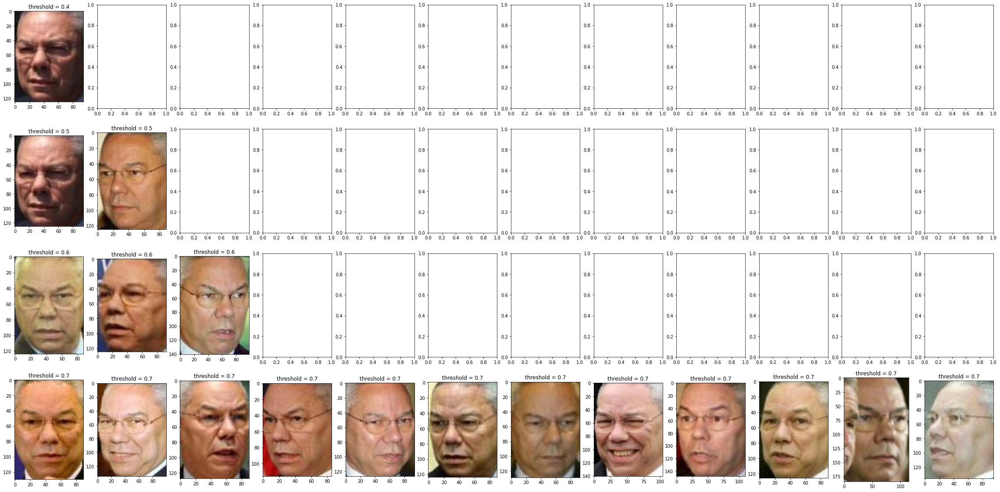

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7]

fig, ax = plt.subplots(nrows = len(threshold_values), ncols = 12, figsize=(40, 20))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    for j in range(len(ans_ids)):
        ax[i][j].set_title(f"threshold = {threshold}")
        ax[i][j].imshow(cropped_faces[ans_ids[j]])

plt.show()

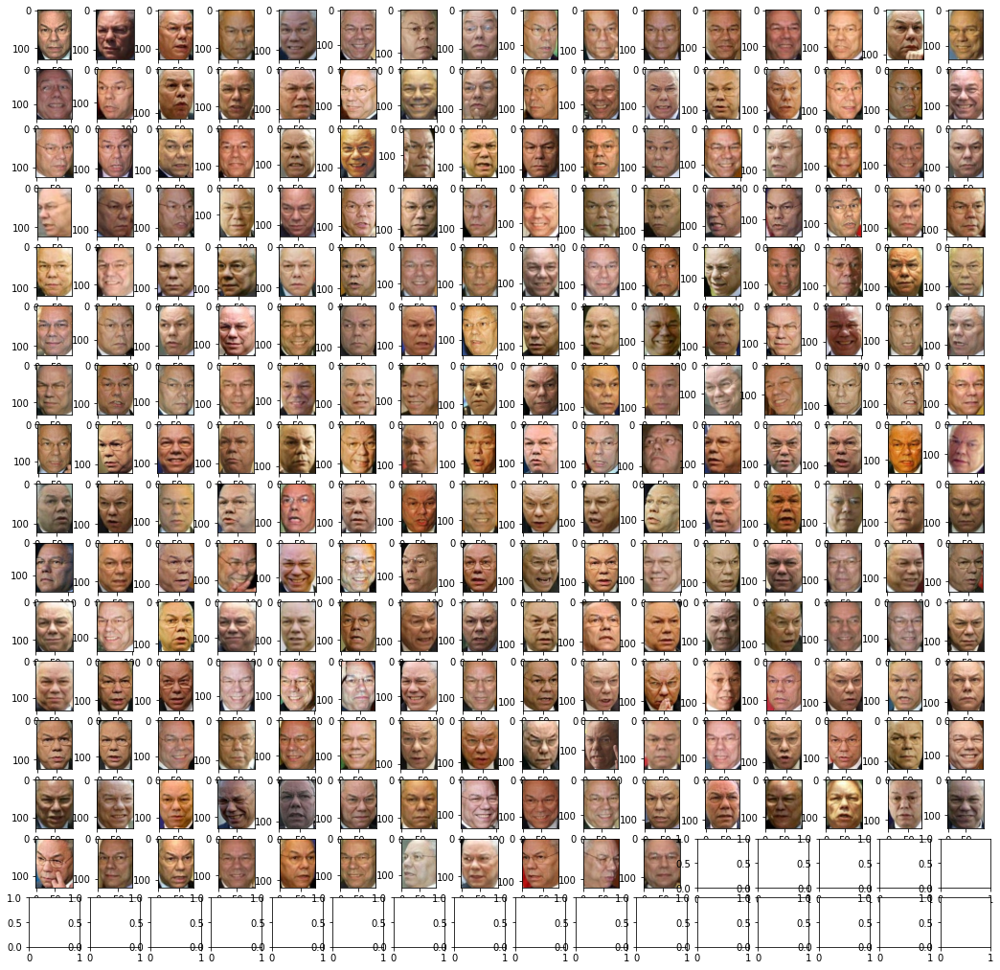

In [ ]:
sq_size = int(sqrt(len(cropped_faces)))+1

fig, ax = plt.subplots(nrows = sq_size, ncols = sq_size, figsize=(18, 18))

for i,image in enumerate(cropped_faces):
  ax[i//sq_size][i%sq_size].imshow(image)

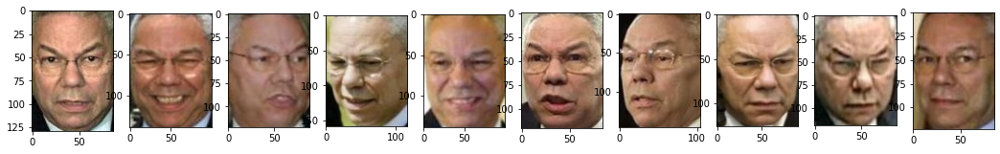

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 10, figsize=(18, 10))

id = int(0)
for i,image in enumerate(cropped_faces):
  if i % 25 == 0:
    ax[id].imshow(image)
    id += 1

average degree = 177.96610169491526676211


component number = 1
size of component = 235
ids images = 211 95 48 234
approximate answer = 4

component number = 2
size of component = 1
ids images = 177
approximate answer = 1

number of components = 2

# Эксперименты - Tony_Blair

In [ ]:
import os
import glob

directory = r'/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Tony_Blair'

cropped_faces = []

counter = int(0)

for path in glob.iglob(os.path.join(directory, "*.jpg")):
    counter += 1
    image = cv2.imread(path) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    face, result = get_face(image)
    if result == 1:
        cropped_faces.append(face)

print(len(cropped_faces))

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


144


In [ ]:
array_embadding = get_embaddings(cropped_faces)

In [ ]:
n = len(array_embadding)

cosine_matrix = np.zeros(shape = (n, n), dtype = np.float64)

for i in range(n):
  for j in range(n):
      cosine_matrix[i, j] = cosine_similarity(array_embadding[i], array_embadding[j])

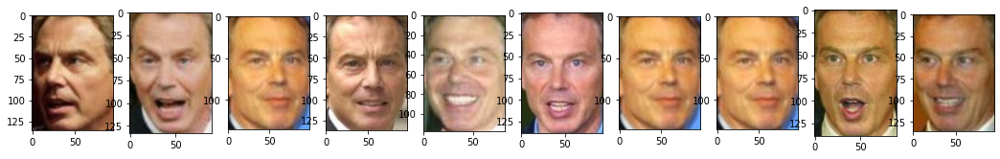

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 10, figsize=(18, 10))

for i in range(10):
    id = np.random.randint(low = 0, high = n)
    ax[i].imshow(cropped_faces[id])

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)

    algorithm2 = Algorithm_greedy2(n, adj_matrix)
    algorithm2.work()
    ans_ids2 = merge_answers(algorithm2.answers)

    print(f"threshold = {threshold}, Algorithm1 = {len(ans_ids)}, Algorithm2 = {len(ans_ids2)}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


threshold = 0.4, Algorithm1 = 4, Algorithm2 = 4
threshold = 0.5, Algorithm1 = 8, Algorithm2 = 7
threshold = 0.6, Algorithm1 = 18, Algorithm2 = 16
threshold = 0.7, Algorithm1 = 51, Algorithm2 = 42
threshold = 0.8, Algorithm1 = 110, Algorithm2 = 107


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


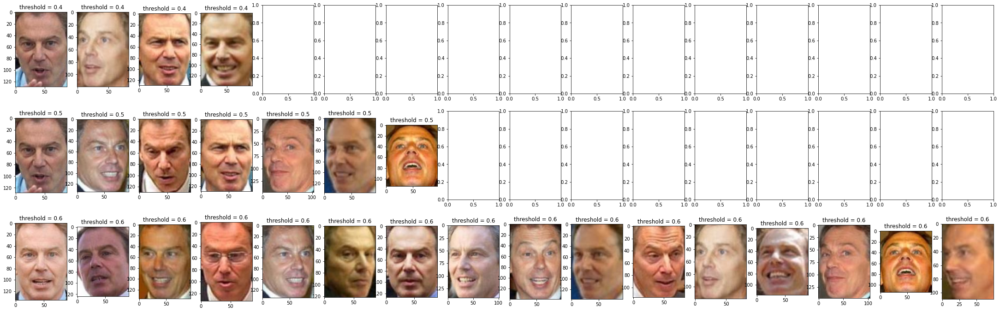

In [ ]:
threshold_values = [0.4, 0.5, 0.6]

fig, ax = plt.subplots(nrows = len(threshold_values), ncols = 16, figsize=(38, 12))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    for j in range(len(ans_ids)):
        ax[i][j].set_title(f"threshold = {threshold}")
        ax[i][j].imshow(cropped_faces[ans_ids[j]])

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


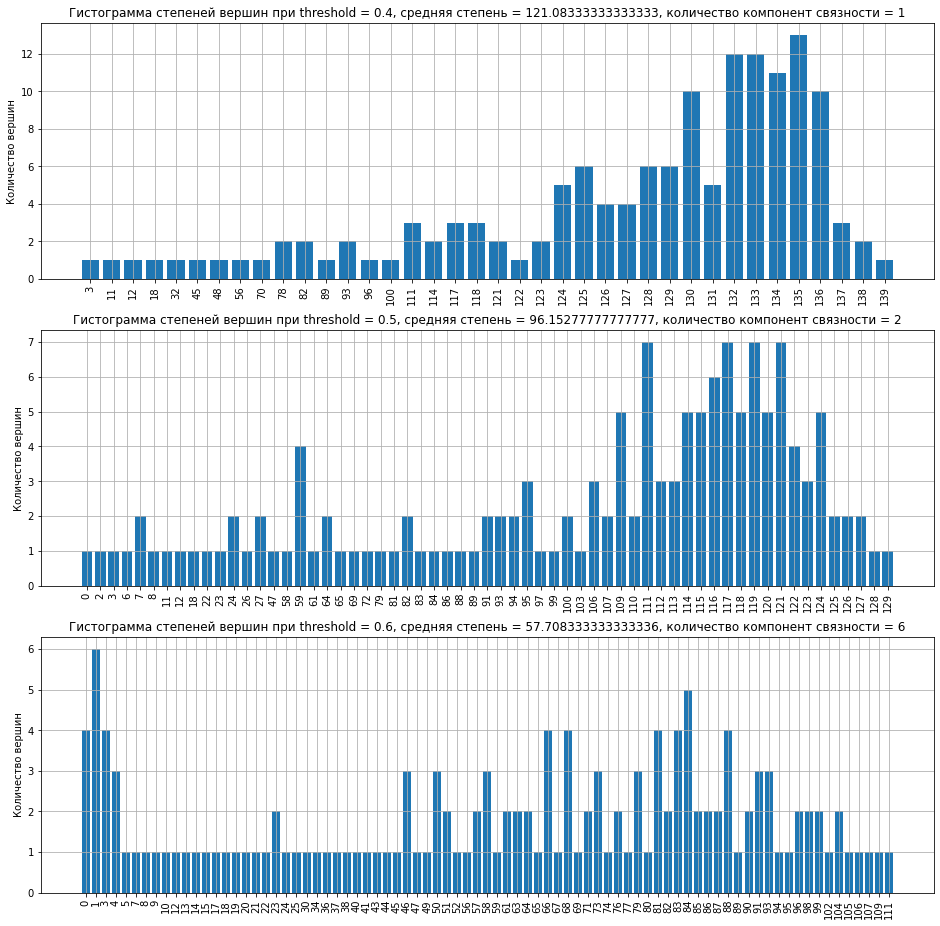

In [ ]:
threshold_values = [0.4, 0.5, 0.6]

fig, ax = plt.subplots(nrows = len(threshold_values), figsize=(16, 16))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    keys, values, mean = algorithm.getdegs()
    ax[i].bar(keys, values)
    ax[i].grid()
    ax[i].set_xticklabels(keys, rotation=90)
    ax[i].set_ylabel("Количество вершин")
    ax[i].set_title(f"Гистограмма cтепеней вершин при threshold = {threshold}, средняя степень = {mean}, количество компонент связности = {len(algorithm.components)}")

plt.show()

In [ ]:
threshold = 0.6

file = open(r'/content/gdrive/MyDrive/graduate_work/adj_file.txt', "w")

file.write(str(len(array_embadding)))
file.write("\n")

for i in range(n):
    for j in range(n):
        if cosine_matrix[i, j] > threshold:
            file.write("1 ")
        else:
            file.write("0 ")
    file.write("\n")

file.close()

average degree = 55.15277777777777856727

component number = 1

size of component = 140
ids images = 143 18 25 24 41 1 7 28 50 51 66 71 81 104 111 132
approximate answer = 16

component number = 2
size of component = 2
ids images = 73
approximate answer = 1

component number = 3
size of component = 1
ids images = 86
approximate answer = 1

component number = 4
size of component = 1
ids images = 120
approximate answer = 1

number of components = 4

In [ ]:
ans_ids = [143, 18, 25, 24, 41, 1, 7, 28, 50, 51, 66, 71, 81, 104, 111, 132, 73, 86, 120]

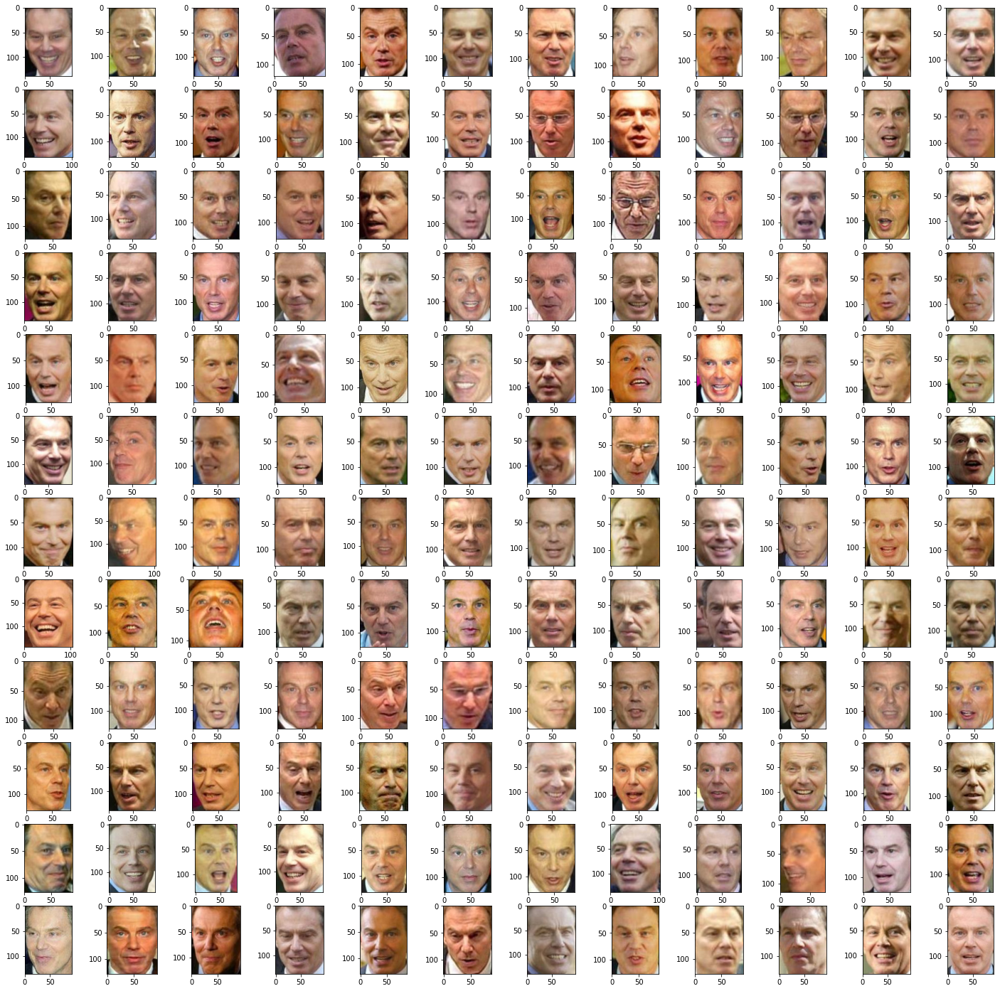

In [ ]:
fig, ax = plt.subplots(nrows = 12, ncols = 12, figsize=(25, 25))

for i,image in enumerate(cropped_faces):
  ax[i//12][i%12].imshow(image)

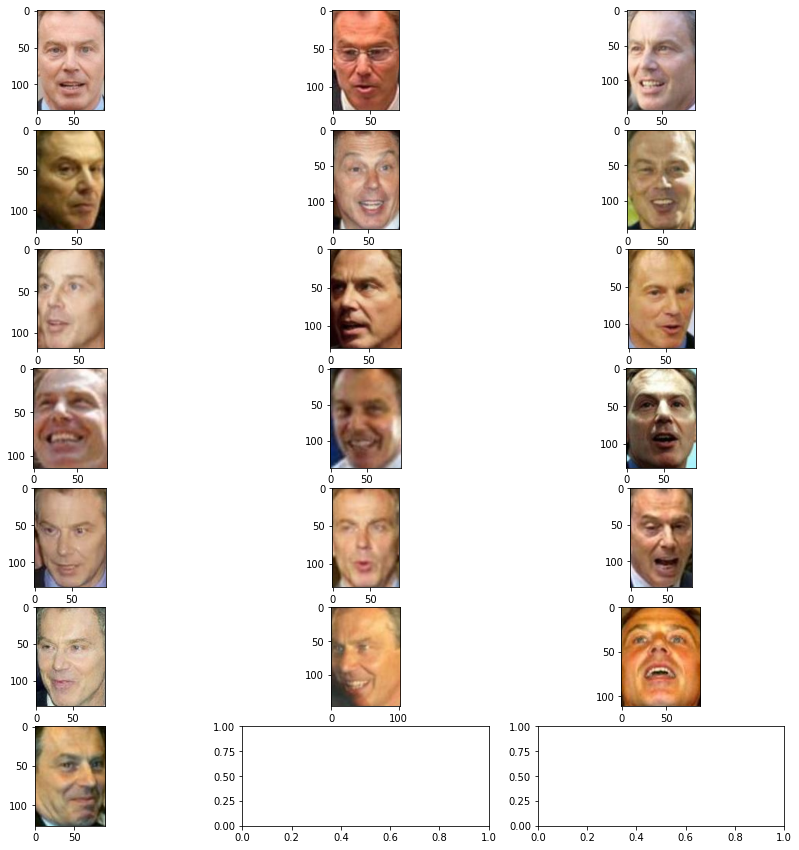

In [ ]:
fig, ax = plt.subplots(nrows = (len(ans_ids)+2)//3, ncols = 3, figsize=(15, 15))

for i,id_image in enumerate(ans_ids):
  ax[i//3][i%3].imshow(cropped_faces[id_image])

# Эксперименты - Donald_Rumsfeld

In [ ]:
import os
import glob

directory = r'/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Donald_Rumsfeld'

cropped_faces = []

counter = int(0)

for path in glob.iglob(os.path.join(directory, "*.jpg")):
    counter += 1
    image = cv2.imread(path) 
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    face, result = get_face(image)
    if result == 1:
        cropped_faces.append(face)

print(len(cropped_faces))

121


In [ ]:
for i,image in enumerate(cropped_faces):
    cv2.imwrite('img'+str(i)+'.jpg',image)

In [ ]:
array_embadding = get_embaddings(cropped_faces)

In [ ]:
n = len(array_embadding)

cosine_matrix = np.zeros(shape = (n, n), dtype = np.float64)

for i in range(n):
  for j in range(n):
      cosine_matrix[i, j] = cosine_similarity(array_embadding[i], array_embadding[j])

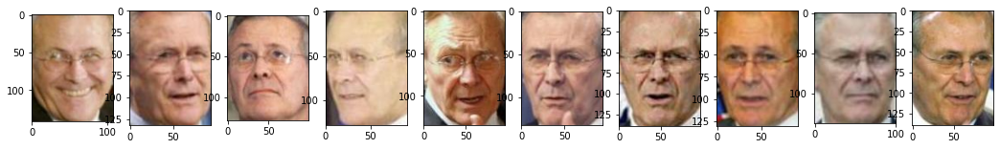

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 10, figsize=(18, 10))

for i in range(10):
    id = np.random.randint(low = 0, high = n)
    ax[i].imshow(cropped_faces[id])

In [ ]:
threshold_values = [0.4, 0.5, 0.6, 0.7, 0.8]

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)

    algorithm2 = Algorithm_greedy2(n, adj_matrix)
    algorithm2.work()
    ans_ids2 = merge_answers(algorithm2.answers)

    print(f"threshold = {threshold}, Algorithm1 = {len(ans_ids)}, Algorithm2 = {len(ans_ids2)}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


threshold = 0.4, Algorithm1 = 2, Algorithm2 = 2
threshold = 0.5, Algorithm1 = 4, Algorithm2 = 4
threshold = 0.6, Algorithm1 = 9, Algorithm2 = 8
threshold = 0.7, Algorithm1 = 23, Algorithm2 = 22
threshold = 0.8, Algorithm1 = 59, Algorithm2 = 59


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


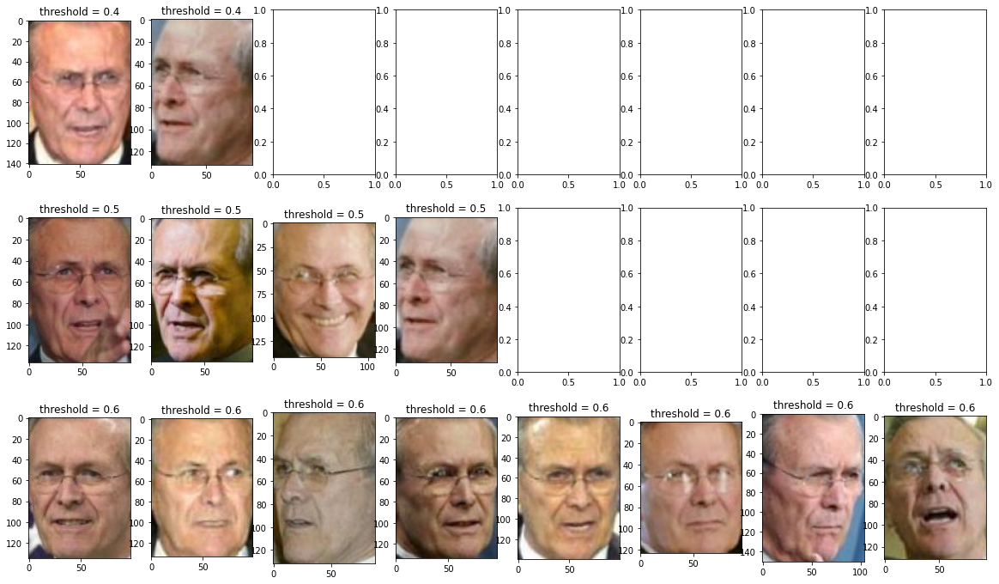

In [ ]:
threshold_values = [0.4, 0.5, 0.6]

fig, ax = plt.subplots(nrows = len(threshold_values), ncols = 8, figsize=(20, 12))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    for j in range(len(ans_ids)):
        ax[i][j].set_title(f"threshold = {threshold}")
        ax[i][j].imshow(cropped_faces[ans_ids[j]])

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


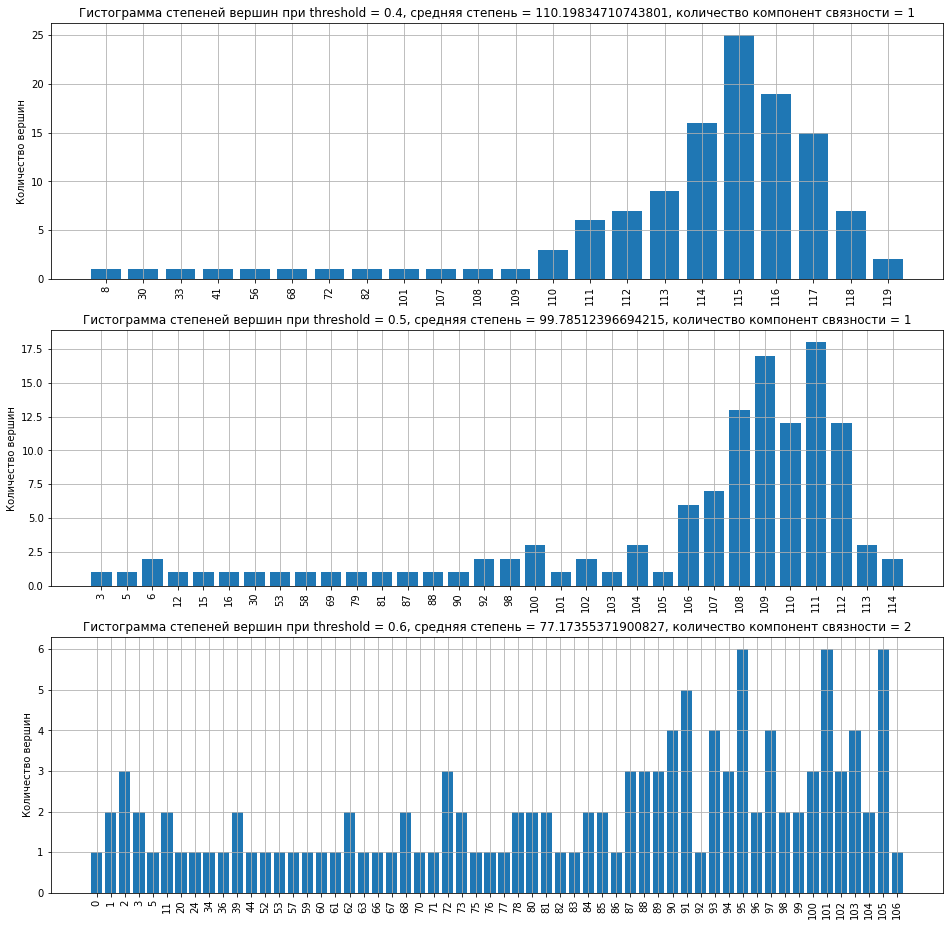

In [ ]:
threshold_values = [0.4, 0.5, 0.6]

fig, ax = plt.subplots(nrows = len(threshold_values), figsize=(16, 16))

for i, threshold in enumerate(threshold_values):
    adj_matrix = (cosine_matrix > threshold)
    adj_matrix = np.array(adj_matrix, dtype = np.int)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    keys, values, mean = algorithm.getdegs()
    ax[i].bar(keys, values)
    ax[i].grid()
    ax[i].set_xticklabels(keys, rotation=90)
    ax[i].set_ylabel("Количество вершин")
    ax[i].set_title(f"Гистограмма cтепеней вершин при threshold = {threshold}, средняя степень = {mean}, количество компонент связности = {len(algorithm.components)}")

plt.show()

In [ ]:
threshold = 0.6

file = open(r'/content/gdrive/MyDrive/graduate_work/adj_file.txt', "w")

file.write(str(len(array_embadding)))
file.write("\n")

for i in range(n):
    for j in range(n):
        if cosine_matrix[i, j] > threshold:
            file.write("1 ")
        else:
            file.write("0 ")
    file.write("\n")

file.close()

average degree = 80.36363636363635976068

component number = 1

size of component = 118
ids images = 80 19 27 40 51 79 92
approximate answer = 7

component number = 2
size of component = 1
ids images = 38
approximate answer = 1

component number = 3
size of component = 1
ids images = 42
approximate answer = 1

component number = 4
size of component = 1
ids images = 113
approximate answer = 1

number of components = 4

In [ ]:
ans_ids = [80, 19, 27, 40, 51, 79, 92, 38, 42, 113]

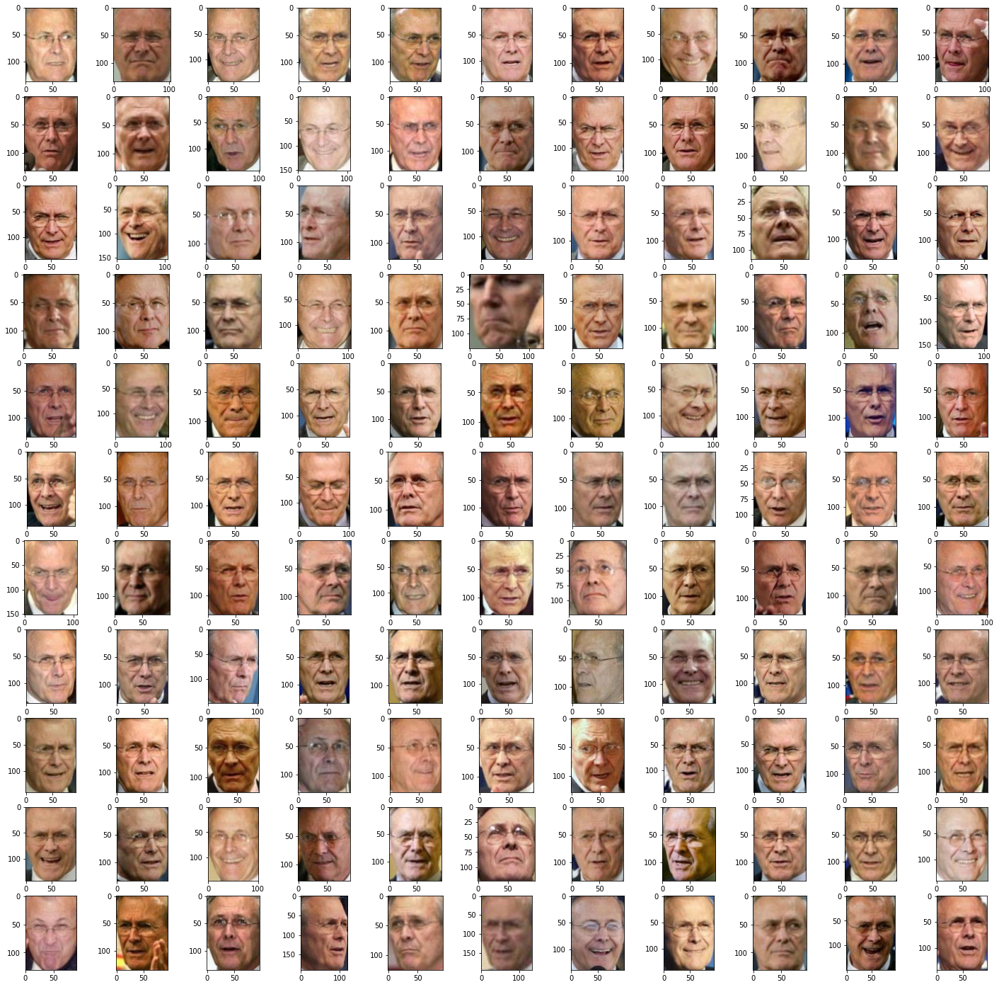

In [ ]:
fig, ax = plt.subplots(nrows = 11, ncols = 11, figsize=(25, 25))

for i,image in enumerate(cropped_faces):
  ax[i//11][i%11].imshow(image)

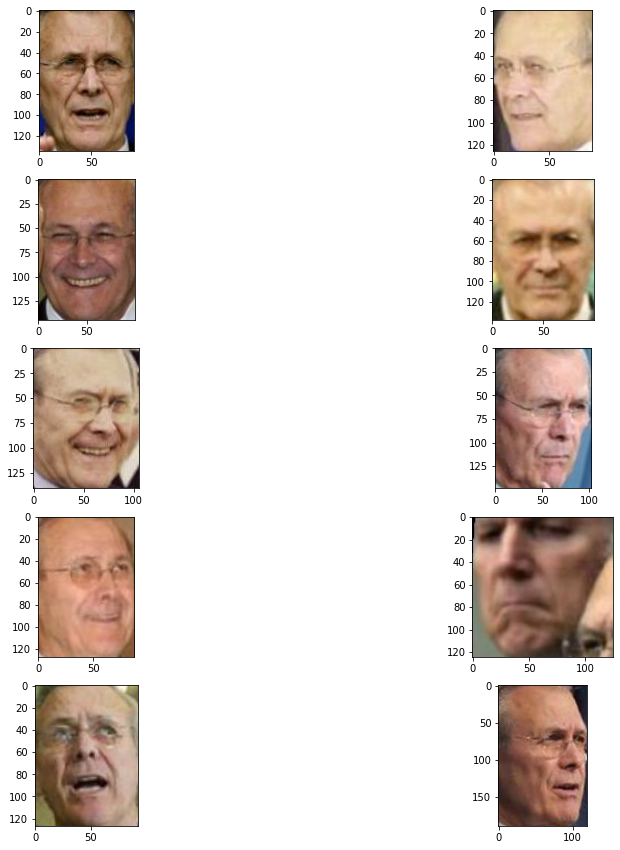

In [ ]:
fig, ax = plt.subplots(nrows = len(ans_ids)//2, ncols = 2, figsize=(15, 15))

for i,id_image in enumerate(ans_ids):
  ax[i//2][i%2].imshow(cropped_faces[id_image])

# Подготовка к эксперименту из 1.6

In [ ]:
directory = r'/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled'

images_labels = []
images_path = []

for path in glob.iglob(os.path.join(directory, "**", "*.jpg")):

    person = path.split("/")[-2]

    images_path.append(path)
    images_labels.append(person)

In [ ]:
images_labels = np.array(images_labels)
images_path = np.array(images_path)

In [ ]:
images_unique_labels, images_unique_count = np.unique(images_labels, return_counts = True)

In [ ]:
images_unique_labels_more_than_one = []

for i in range(len(images_unique_labels)):
    person = images_unique_labels[i]
    if (images_unique_count[i] <= 1):
        continue
    images_unique_labels_more_than_one.append(person)

In [ ]:
file_write = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/colin_powell_with_bbox.txt', "w")

path_need = images_path[images_labels=="Colin_Powell"]

for id, path in enumerate(path_need):
    if id == 177:
        continue
    image = open_image(path)
    annotation = model.predict_jsons(image)
    if annotation[0]['score'] == -1:
        print("BAD_ATTEMPT")
        continue
    bbox = annotation[0]['bbox']
    x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
    file_write.write(path + " " + str(x1) + " " + str(y1) + " " + str(x2) + " " + str(y2) + "\n")

file_write.close()

236


In [ ]:
file_write = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/all_paths_with_bbox.txt', "w")

for label in images_unique_labels_more_than_one:

    if label == 'Colin_Powell':
        continue

    path_need = images_path[images_labels==label]
    ready_path = []

    for id, path in enumerate(path_need):
        image = open_image(path)
        annotation = model.predict_jsons(image)
        if annotation[0]['score'] == -1:
            print("BAD_ATTEMPT")
            continue
        bbox = annotation[0]['bbox']
        x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
        ready_path.append(path + " " + str(x1) + " " + str(y1) + " " + str(x2) + " " + str(y2) + "\n")

    if len(ready_path) > 1:
        for path in ready_path:
            file_write.write(path)
        print(label + " ready!")

file_write.close()

In [ ]:
with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/colin_powell_with_bbox.txt') as f:
    lines = f.readlines()

array_embadding = []
array_labels = []

for id, line in enumerate(lines):
    list_of_strings = line.split(' ')
    path = list_of_strings[0]
    bbox = [int(list_of_strings[1]), int(list_of_strings[2]), int(list_of_strings[3]), int(list_of_strings[4])]
    x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
    image = open_image(path)
    image = image[y1:y2, x1:x2]
    embadding = get_embadding(image)
    label = path.split('/')[-2]
    array_labels.append(label)
    array_embadding.append(embadding)

In [ ]:
with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/all_paths_with_bbox.txt') as f:
    lines = f.readlines()

array_embadding_s1 = []
array_labels_s1 = []

for i in range(len(lines)):
    line = lines[i]
    list_of_strings = line.split(' ')
    path = list_of_strings[0]
    bbox = [int(list_of_strings[1]), int(list_of_strings[2]), int(list_of_strings[3]), int(list_of_strings[4])]
    x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
    x1 = max(x1,0)
    y1 = max(y1,0)
    image = open_image(path)
    image = image[y1:y2, x1:x2]
    embadding = get_embadding(image)
    label = path.split('/')[-2]
    array_labels_s1.append(label)
    array_embadding_s1.append(embadding)

In [ ]:
array_embadding = list(array_embadding)
array_labels = list(array_labels)

In [ ]:
for embadding in array_embadding_s1:
    array_embadding.append(embadding)

for label in array_labels_s1:
    array_labels.append(label)   

In [ ]:
file_embaddings = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/embaddings', 'wb')
pickle.dump(array_embadding, file_embaddings)
file_embaddings.close()

file_labels = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/labels', 'wb')
pickle.dump(array_labels, file_labels)
file_labels.close()

In [ ]:
file_embaddings = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/embaddings', 'rb')
embaddings = pickle.load(file_embaddings)
file_embaddings.close()

file_labels = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/labels', 'rb')
labels = pickle.load(file_labels)
file_labels.close()

In [ ]:
n = len(embaddings)
cos_matrix = np.zeros(shape=(n,n))
for i in range(n):
    for j in range(n):
        cos_matrix[i,j] = cosine_similarity(embaddings[i], embaddings[j])

In [ ]:
file_matrix = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/cos_matrix', 'wb')
pickle.dump(cos_matrix, file_matrix)
file_matrix.close()

In [ ]:
with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/colin_powell_with_bbox.txt') as f:
    powell_paths = f.readlines()

with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/all_paths_with_bbox.txt') as f:
    other_paths = f.readlines()

paths = []
for path in powell_paths:
    paths.append(path.split(' ')[0])
for path in other_paths:
    paths.append(path.split(' ')[0])

paths = np.array(paths)

In [ ]:
file_paths = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/paths', 'wb')
pickle.dump(paths, file_paths)
file_paths.close()

In [ ]:
with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/colin_powell_with_bbox.txt') as f:
    lines = f.readlines()

array_embadding = []
array_labels = []

for id, line in enumerate(lines):
    list_of_strings = line.split(' ')
    path = list_of_strings[0]
    bbox = [int(list_of_strings[1]), int(list_of_strings[2]), int(list_of_strings[3]), int(list_of_strings[4])]
    x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
    image = open_image(path)
    image = image[y1:y2, x1:x2]
    embadding = get_embadding(image)
    label = path.split('/')[-2]
    array_labels.append(label)
    array_embadding.append(embadding)

In [ ]:
with open(r'/content/gdrive/MyDrive/graduate_work/experiment1/all_paths_with_bbox.txt') as f:
    lines = f.readlines()

array_embadding_s1 = []
array_labels_s1 = []

for i in range(len(lines)):
    line = lines[i]
    list_of_strings = line.split(' ')
    path = list_of_strings[0]
    bbox = [int(list_of_strings[1]), int(list_of_strings[2]), int(list_of_strings[3]), int(list_of_strings[4])]
    x1,y1,x2,y2 = bbox[0],bbox[1],bbox[2],bbox[3]
    x1 = max(x1,0)
    y1 = max(y1,0)
    image = open_image(path)
    image = image[y1:y2, x1:x2]
    embadding = get_embadding(image)
    label = path.split('/')[-2]
    array_labels_s1.append(label)
    array_embadding_s1.append(embadding)

In [ ]:
file_write = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/all_paths_nearest_id_and_cosine_distance.txt', "w")

cnt_bad_ans = int(0)

for i in range(len(array_embadding_s1)):

    embadding = array_embadding_s1[i]
    label = array_labels_s1[i]
    cos_dst_bst, id_bst = -1e18, 0

    for j in range(len(array_embadding_s1)):
        if i == j:
            continue
        nembadding = array_embadding_s1[j]
        cos_dst = cosine_similarity(embadding, nembadding)
        if cos_dst_bst < cos_dst:
            cos_dst_bst = cos_dst
            id_bst = j

    if array_labels_s1[i] != array_labels_s1[id_bst]:
        cnt_bad_ans += 1

    file_write.write(str(id_bst) + " " + str(cos_dst_bst) + "\n")

file_write.close()

In [ ]:
print(cnt_bad_ans)

664


# Эксперименты с распознаванием

In [ ]:
import pickle 

In [ ]:
file_embaddings = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/embaddings', 'rb')
embaddings = pickle.load(file_embaddings)
embaddings = np.array(embaddings)
file_embaddings.close()

file_labels = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/labels', 'rb')
labels = pickle.load(file_labels)
labels = np.array(labels)
file_labels.close()

In [ ]:
file_matrix = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/cos_matrix', 'rb')
cos_matrix = pickle.load(file_matrix)
file_matrix.close()

In [ ]:
file_paths = open(r'/content/gdrive/MyDrive/graduate_work/experiment1/paths', 'rb')
paths = pickle.load(file_paths)
file_paths.close()

In [ ]:
print(labels)

['Colin_Powell' 'Colin_Powell' 'Colin_Powell' ... 'Zoran_Djindjic'
 'Zoran_Djindjic' 'Zoran_Djindjic']


In [ ]:
def recalc(embaddings, labels, cos_matrix):
    bad = 0
    embaddings_good = []
    labels_good = []
    n = len(embaddings)
    for i in range(n):
        ids = np.arange(0, n)
        j = np.argmax(cos_matrix[i][ids != i])
        if labels[i] != labels[j]:
            bad += 1
        else:
            embaddings_good.append(embaddings[i])
            labels_good.append(labels[i])
            # TODO ? If one last in class???
    print("already bad =", bad)
    return (np.array(embaddings_good), np.array(labels_good))

In [ ]:
labels_unique, ni = np.unique(labels, return_counts = True)
print(len(labels_unique), np.amin(ni))

1680 2


In [ ]:
embaddings_good, labels_good = recalc(embaddings, labels, cos_matrix)

already bad = 668


In [ ]:
labels_unique, ni = np.unique(labels_good, return_counts = True)
print(len(labels_unique), np.amin(ni))

In [ ]:
def ids_dominating_get(cosine_matrix):
    n = len(cosine_matrix)
    adj_matrix = (cosine_matrix > 0.6)
    adj_matrix = np.array(adj_matrix, dtype = np.int64)
    algorithm = Algorithm_greedy2(n, adj_matrix)
    algorithm.work()
    ans_ids = merge_answers(algorithm.answers)
    return ans_ids

In [ ]:
def exp1(ids_check, ids_all, cos_matrix, ids_dominating):
    cnt_dominating = 0
    cnt_all = 0

    for id in ids_all:
        ids_for_max = ids_all[ids_all != id]

        best_id = ids_for_max[np.argmax(cos_matrix[id][ids_for_max])] #best s1

        if labels[id] == labels[best_id]:
            best_id_outside = ids_dominating[np.argmax(cos_matrix[id][ids_dominating])] #best d_p
            if cos_matrix[id, best_id] < cos_matrix[id, best_id_outside]:
                cnt_dominating += 1
            
            best_id_outside = ids_check[np.argmax(cos_matrix[id][ids_check])] #best r_p 
            if cos_matrix[id, best_id] < cos_matrix[id, best_id_outside]:
                print('[', id, ',', best_id, ',', best_id_outside, '], ')
                cnt_all += 1

    person = labels[ids_check[0]]
    name = person.split('_')

    #if cnt_all != 0 and cnt_all != cnt_dominating:
    #    print(name[0], name[1], '&', len(ids_check), '&', len(ids_dominating), '&', cnt_dominating, '&', cnt_all, ' \\\ \hline')

In [ ]:
def calculate_person(person, embaddings, labels):
    
    ids_person = np.arange(0, len(embaddings), dtype = np.int64)[labels == person]

    cnt_images_person = len(ids_person)

    #print(person, "images for person = ", cnt_images_person)

    matrix_slice = np.zeros(shape = (cnt_images_person, cnt_images_person))

    for i in range(cnt_images_person):
      for j in range(cnt_images_person):
        matrix_slice[i,j] = cos_matrix[ids_person[i], ids_person[j]]

    ids_dominating_local = np.array(ids_dominating_get(matrix_slice))
    ids_dominating_global = ids_person[ids_dominating_local]

    ids_diff = np.arange(0, len(embaddings), dtype = np.int64)[labels != person]

    exp1(ids_person, ids_diff, cos_matrix, ids_dominating_global)

In [ ]:
nlabels = labels_unique[ni > 10]

print(len(nlabels))

for person in nlabels:

    calculate_person(person, embaddings, labels)

    #print("\n")

143
[ 8122 , 8121 , 262 ], 
[ 346 , 340 , 419 ], 
[ 3770 , 3773 , 424 ], 
[ 3918 , 3917 , 551 ], 
[ 6084 , 6083 , 654 ], 
[ 3283 , 3282 , 695 ], 
[ 4322 , 4321 , 721 ], 
[ 2160 , 2159 , 1115 ], 
[ 4186 , 4185 , 1122 ], 
[ 4900 , 4899 , 1385 ], 
[ 5781 , 5784 , 1460 ], 
[ 5976 , 5980 , 1467 ], 
[ 1039 , 1038 , 131 ], 
[ 4942 , 4941 , 151 ], 
[ 4943 , 4942 , 83 ], 
[ 8681 , 8682 , 208 ], 
[ 6164 , 6163 , 2080 ], 
[ 8140 , 8139 , 2031 ], 
[ 5390 , 5391 , 2170 ], 
[ 908 , 909 , 2811 ], 
[ 598 , 597 , 3252 ], 
[ 4118 , 4119 , 3398 ], 
[ 3512 , 3513 , 3446 ], 
[ 7013 , 7014 , 3561 ], 
[ 6124 , 6125 , 3697 ], 
[ 5771 , 5776 , 3791 ], 
[ 5836 , 5846 , 3829 ], 
[ 6497 , 6498 , 3785 ], 
[ 6538 , 6536 , 3818 ], 
[ 2514 , 2515 , 3884 ], 
[ 7012 , 7010 , 3891 ], 
[ 8025 , 8030 , 3976 ], 
[ 1217 , 1219 , 4247 ], 
[ 2598 , 2597 , 4241 ], 
[ 5881 , 5879 , 4338 ], 
[ 7970 , 7971 , 4366 ], 
[ 5561 , 5562 , 4393 ], 
[ 2701 , 2796 , 4509 ], 
[ 8866 , 8868 , 4758 ], 
[ 299 , 298 , 4966 ], 
[ 1018 , 1019 , 

/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Hugh_Grant/Hugh_Grant_0007.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Hugh_Grant/Hugh_Grant_0005.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Alejandro_Toledo/Alejandro_Toledo_0018.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Jean-Claude_Juncker/Jean-Claude_Juncker_0002.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Jean-Claude_Juncker/Jean-Claude_Juncker_0001.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Bill_Gates/Bill_Gates_0014.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Bernard_Landry/Bernard_Landry_0002.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Bernard_Landry/Bernard_Landry_0003.jpg
/content/gdrive/MyDrive/arcface-pytorch/data/Datasets/lfw-deepfunneled/Colin_Powell/Colin_Powell_0142.jpg
/content/gdriv

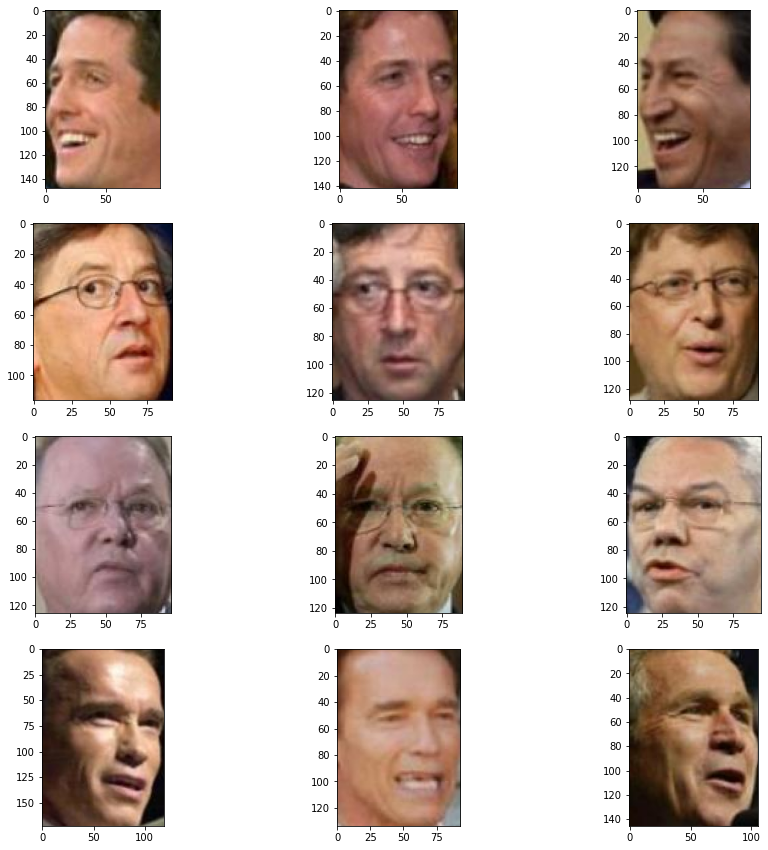

In [ ]:
fig, ax = plt.subplots(nrows = 4, ncols = 3, figsize=(15, 15))

#ids = [ [2160, 2159, 1115], [1039, 1038, 131], [5881, 5879, 4338] ]

for i in range(4):
    for j in range(3):
        print(paths[ids[i][j]])
        path = paths[ids[i][j]]
        image = cv2.imread(path) 
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        face, result = get_face(image)
        if result == 1:
            ax[i][j].imshow(face)